<a href="https://colab.research.google.com/github/prant1719/BADS7105-CRM/blob/main/HW6-%20Customer_Segmentation/HW6_Customer_Segmentation_Group2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Load Dependencies**

In [ ]:
!pip install pycaret

     |████████████████████████████████| 266 kB 5.2 MB/s 
     |████████████████████████████████| 1.7 MB 45.8 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 80 kB 8.8 MB/s 
     |████████████████████████████████| 261 kB 57.6 MB/s 
     |████████████████████████████████| 1.3 MB 63.8 MB/s 
     |████████████████████████████████| 6.8 MB 39.8 MB/s 
     |████████████████████████████████| 167 kB 61.9 MB/s 
     |████████████████████████████████| 14.6 MB 120 kB/s 
     |████████████████████████████████| 56 kB 5.0 MB/s 
     |████████████████████████████████| 271 kB 66.7 MB/s 
     |████████████████████████████████| 2.0 MB 20.2 MB/s 
     |████████████████████████████████| 111 kB 54.1 MB/s 
     |████████████████████████████████| 675 kB 47.5 MB/s 
     |████████████████████████████████| 3.1 MB 50.7 MB/s 
     |██████████████████

In [ ]:
import pandas as pd
from pycaret.clustering import *

# **Load Data**

In [ ]:
df = pd.read_csv('Supermarket Data.csv')

In [ ]:
df['SHOP_DATE'] = df['SHOP_DATE'].apply(lambda x: pd.to_datetime(str(x), format='%Y%m%d'))

In [ ]:
df.tail(5)

,SHOP_WEEK,SHOP_DATE,SHOP_WEEKDAY,SHOP_HOUR,QUANTITY,SPEND,PROD_CODE,PROD_CODE_10,PROD_CODE_20,PROD_CODE_30,PROD_CODE_40,CUST_CODE,CUST_PRICE_SENSITIVITY,CUST_LIFESTAGE,BASKET_ID,BASKET_SIZE,BASKET_PRICE_SENSITIVITY,BASKET_TYPE,BASKET_DOMINANT_MISSION,STORE_CODE,STORE_FORMAT,STORE_REGION
956569,200617,2006-06-22,5,12,3,3.96,PRD0904997,CL00074,DEP00021,G00007,D00002,NaN,NaN,NaN,994101100088778,M,MM,Top Up,Fresh,STORE00002,LS,W01
956570,200633,2006-10-13,6,20,3,3.96,PRD0904997,CL00074,DEP00021,G00007,D00002,NaN,NaN,NaN,994102700099738,L,LA,Top Up,Fresh,STORE00002,LS,W01
956571,200617,2006-06-22,5,18,3,3.96,PRD0904997,CL00074,DEP00021,G00007,D00002,CUST0000544241,LA,YA,994101100506174,L,LA,Top Up,Fresh,STORE00002,LS,W01
956572,200619,2006-07-06,5,19,3,3.96,PRD0904997,CL00074,DEP00021,G00007,D00002,CUST0000423155,LA,YF,994101300433650,L,LA,Full Shop,Fresh,STORE00002,LS,W01
956573,200635,2006-10-23,2,21,3,3.96,PRD0904997,CL00074,DEP00021,G00007,D00002,NaN,NaN,NaN,994102900104676,L,MM,Top Up,Fresh,STORE00002,LS,W01


In [ ]:
df.info

<bound method DataFrame.info of         SHOP_WEEK  SHOP_DATE  SHOP_WEEKDAY  SHOP_HOUR  QUANTITY  SPEND  \
0          200732 2007-10-05             6         17         3   6.75   
1          200733 2007-10-10             4         20         3   6.75   
2          200741 2007-12-09             1         11         1   2.25   
3          200731 2007-09-29             7         17         1   2.25   
4          200737 2007-11-10             7         14         3   6.75   
...           ...        ...           ...        ...       ...    ...   
956569     200617 2006-06-22             5         12         3   3.96   
956570     200633 2006-10-13             6         20         3   3.96   
956571     200617 2006-06-22             5         18         3   3.96   
956572     200619 2006-07-06             5         19         3   3.96   
956573     200635 2006-10-23             2         21         3   3.96   

         PROD_CODE PROD_CODE_10 PROD_CODE_20 PROD_CODE_30 PROD_CODE_40  \
0    

# **Prepare customer single view**

# Define features

Total visits = COUNT(DISTINCT BASKET ID)

Ticket size = SUM(SPEND)/COUNT(DISTINCT BASKET ID)

Total no. of SKUs


# Calculate features

In [ ]:
df.columns

Index(['SHOP_WEEK', 'SHOP_DATE', 'SHOP_WEEKDAY', 'SHOP_HOUR', 'QUANTITY',
       'SPEND', 'PROD_CODE', 'PROD_CODE_10', 'PROD_CODE_20', 'PROD_CODE_30',
       'PROD_CODE_40', 'CUST_CODE', 'CUST_PRICE_SENSITIVITY', 'CUST_LIFESTAGE',
       'BASKET_ID', 'BASKET_SIZE', 'BASKET_PRICE_SENSITIVITY', 'BASKET_TYPE',
       'BASKET_DOMINANT_MISSION', 'STORE_CODE', 'STORE_FORMAT',
       'STORE_REGION'],
      dtype='object')

In [ ]:
df['CUST_LIFESTAGE'].replace(to_replace=['OA','OF','OT','PE','YA','YF'], value=[1,2,3,4,5,6], inplace=True)
df['BASKET_TYPE'].replace(to_replace=['Top Up','Full Shop','Small Shop','XX'], value=[1,2,3,0], inplace=True)
df['BASKET_DOMINANT_MISSION'].replace(to_replace=['Grocery','Fresh','Mixed','Nonfood','XX'],value =[1,2,3,4,0],inplace=True)

In [ ]:
##prepare customer single view
df_csv = df_groupby = df[df['CUST_CODE'].notnull()].groupby(by=['CUST_CODE']).agg(TotalSpend=('SPEND', 'sum'),
                                                                                  TotalVisits=('BASKET_ID', 'nunique'),
                                                                                  TotalSKUs=('PROD_CODE', 'nunique'),
                                                                                  FirstDate=('SHOP_DATE', 'min'),
                                                                                  LastDate=('SHOP_DATE', 'max'),
                                                                                  SHOP_HOUR=('SHOP_HOUR','mean'),
                                                                                  LifeStage=('CUST_LIFESTAGE','max'),
                                                                                  BasketType=('BASKET_TYPE','max'),
                                                                                  BasketMission=('BASKET_DOMINANT_MISSION','max')
                                                                                  ).reset_index()

In [ ]:
df_csv.dropna()

,CUST_CODE,TotalSpend,TotalVisits,TotalSKUs,FirstDate,LastDate,SHOP_HOUR,LifeStage,BasketType,BasketMission
1,CUST0000000369,959.33,220,189,2006-04-16,2008-07-05,15.420601,1.0,3,4
5,CUST0000001194,2493.83,103,403,2006-04-22,2008-06-20,17.501669,3.0,3,4
6,CUST0000002257,1.99,1,1,2006-07-21,2006-07-21,13.000000,5.0,3,4
7,CUST0000002499,0.34,1,1,2006-04-14,2006-04-14,10.000000,6.0,3,2
8,CUST0000002605,1.80,6,1,2006-10-08,2008-06-12,13.666667,3.0,3,1
...,...,...,...,...,...,...,...,...,...,...
6094,CUST0000999569,700.21,109,47,2006-09-01,2008-07-04,15.167742,3.0,3,4
6095,CUST0000999593,453.58,30,206,2006-05-06,2008-04-02,14.831650,6.0,3,4
6096,CUST0000999645,105.11,11,46,2006-04-30,2008-05-08,18.550000,3.0,3,4
6098,CUST0000999935,444.17,21,127,2006-11-29,2008-06-05,14.699153,6.0,3,4


In [ ]:
df_csv.head(20)

,CUST_CODE,TotalSpend,TotalVisits,TotalSKUs,FirstDate,LastDate,SHOP_HOUR,LifeStage,BasketType,BasketMission
0,CUST0000000181,2.44,1,1,2007-01-06,2007-01-06,13.000000,NaN,3,2
1,CUST0000000369,959.33,220,189,2006-04-16,2008-07-05,15.420601,1.0,3,4
2,CUST0000000689,328.57,16,116,2007-07-22,2008-06-23,15.367568,NaN,3,4
3,CUST0000000998,5.95,3,4,2006-05-04,2006-07-07,11.500000,NaN,3,4
4,CUST0000001163,39.74,4,24,2006-10-22,2008-06-22,15.400000,NaN,3,3
5,CUST0000001194,2493.83,103,403,2006-04-22,2008-06-20,17.501669,3.0,3,4
6,CUST0000002257,1.99,1,1,2006-07-21,2006-07-21,13.000000,5.0,3,4
7,CUST0000002499,0.34,1,1,2006-04-14,2006-04-14,10.000000,6.0,3,2
8,CUST0000002605,1.80,6,1,2006-10-08,2008-06-12,13.666667,3.0,3,1
9,CUST0000002637,124.63,15,53,2006-08-03,2008-05-30,15.141176,1.0,3,3


In [ ]:
##calculate ticket size
df_csv['TicketSize'] = df_csv['TotalSpend']/df_csv['TotalVisits']

In [ ]:
##find max date in the dataset
max_date = df_csv['LastDate'].max()

In [ ]:
##calculate total days of the relationship
df_csv['total_days'] = (df_csv['LastDate'] - df_csv['FirstDate']).dt.days + 1

In [ ]:
##calculate recency days
df_csv['recency'] = (max_date - df_csv['LastDate']).dt.days

In [ ]:
df_csv.tail(5)

,CUST_CODE,TotalSpend,TotalVisits,TotalSKUs,FirstDate,LastDate,SHOP_HOUR,LifeStage,BasketType,BasketMission,TicketSize,total_days,recency
6095,CUST0000999593,453.58,30,206,2006-05-06,2008-04-02,14.831650,6.0,3,4,15.119333,698,95
6096,CUST0000999645,105.11,11,46,2006-04-30,2008-05-08,18.550000,3.0,3,4,9.555455,740,59
6097,CUST0000999654,5.86,1,4,2006-06-25,2006-06-25,14.000000,NaN,1,2,5.860000,1,742
6098,CUST0000999935,444.17,21,127,2006-11-29,2008-06-05,14.699153,6.0,3,4,21.150952,555,31
6099,CUST0000999936,17.67,6,13,2006-08-03,2008-04-17,11.933333,6.0,3,3,2.945000,624,80


# **Cluster customers**

In [ ]:
exp_clu = setup(data=df_csv, ignore_features=['CUST_CODE','FirstDate', 'LastDate'], normalize=True)

,Description,Value
0,session_id,8093
1,Original Data,"(6100, 13)"
2,Missing Values,True
3,Numeric Features,7
4,Categorical Features,3
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(6100, 22)"
9,CPU Jobs,-1


In [ ]:
models()

,Name,Reference
ID,,
kmeans,K-Means Clustering,sklearn.cluster._kmeans.KMeans
ap,Affinity Propagation,sklearn.cluster._affinity_propagation.Affinity...
meanshift,Mean Shift Clustering,sklearn.cluster._mean_shift.MeanShift
sc,Spectral Clustering,sklearn.cluster._spectral.SpectralClustering
hclust,Agglomerative Clustering,sklearn.cluster._agglomerative.AgglomerativeCl...
dbscan,Density-Based Spatial Clustering,sklearn.cluster._dbscan.DBSCAN
optics,OPTICS Clustering,sklearn.cluster._optics.OPTICS
birch,Birch Clustering,sklearn.cluster._birch.Birch
kmodes,K-Modes Clustering,kmodes.kmodes.KModes


In [ ]:
get_metrics()

,Name,Display Name,Score Function,Scorer,Target,Args,Greater is Better,Needs Ground Truth,Custom
ID,,,,,,,,,
silhouette,Silhouette,Silhouette,<function silhouette_score at 0x7f523bdc30e0>,make_scorer(silhouette_score),pred,{},True,False,False
chs,Calinski-Harabasz,Calinski-Harabasz,<function calinski_harabasz_score at 0x7f523bd...,make_scorer(calinski_harabasz_score),pred,{},True,False,False
db,Davies-Bouldin,Davies-Bouldin,<function davies_bouldin_score at 0x7f523bdc3440>,make_scorer(davies_bouldin_score),pred,{},True,False,False
hs,Homogeneity Score,Homogeneity,<function homogeneity_score at 0x7f523c039170>,make_scorer(homogeneity_score),pred,{},True,True,False
ari,Rand Index,Rand Index,<function adjusted_rand_score at 0x7f523c033ef0>,make_scorer(adjusted_rand_score),pred,{},True,True,False
cs,Completeness Score,Completeness,<function completeness_score at 0x7f523c039200>,make_scorer(completeness_score),pred,{},True,True,False


# Compare model performance

In [ ]:
metrics = []
for model in models().index:
    if model in ['meanshift', 'optics']:
        continue
    create_model(model)
    metric_result = pull()
    metric_result['model'] = model
    metrics.append(metric_result)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.018,129.8822,4.1016,0,0,0


In [ ]:
cluster_metrics = pd.concat(metrics)
cluster_metrics.set_index("model", inplace=True)
cluster_metrics.sort_values(by='Silhouette', ascending=False, inplace=True)
cluster_metrics.style.highlight_max(subset=['Silhouette', 'Calinski-Harabasz'], color = 'green', axis = 0).highlight_min(subset=['Davies-Bouldin'], color = 'green', axis = 0)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
model,,,,,,
sc,0.693100,64.318000,0.279900,0,0,0
kmeans,0.237500,1767.378000,1.345600,0,0,0
ap,0.210800,182.423300,1.269900,0,0,0
hclust,0.207200,1543.649400,1.451400,0,0,0
birch,0.196900,1434.224200,1.401100,0,0,0
kmodes,-0.018000,129.882200,4.101600,0,0,0
dbscan,-0.302000,18.285600,1.471700,0,0,0


# Spectral Clustering Clustering

In [ ]:
sc = create_model('sc')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6931,64.318,0.2799,0,0,0


In [ ]:
plot_model(sc)

# KMeans Clustering

In [ ]:
kmeans = create_model('kmeans')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2375,1767.378,1.3456,0,0,0


In [ ]:
print(kmeans)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=8093, tol=0.0001, verbose=0)


In [ ]:
plot_model(kmeans)

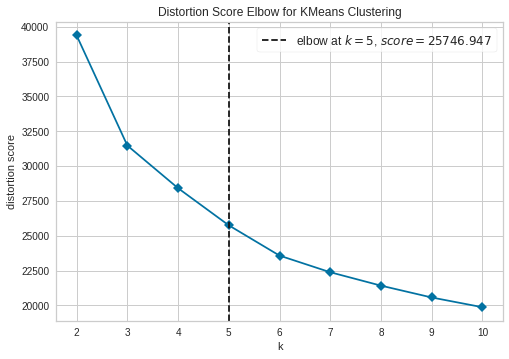

In [ ]:
plot_model(kmeans, plot = 'elbow')

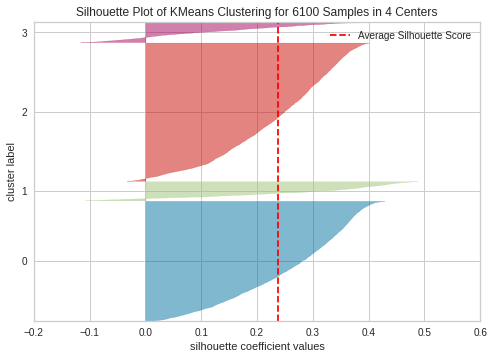

In [ ]:
plot_model(kmeans, plot = 'silhouette')

## https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html

# **Interpret results and plan for actions**

In [ ]:
kmeans_results = assign_model(kmeans)

In [ ]:
kmeans_results.head(5)

,CUST_CODE,TotalSpend,TotalVisits,TotalSKUs,FirstDate,LastDate,SHOP_HOUR,LifeStage,BasketType,BasketMission,TicketSize,total_days,recency,Cluster
0,CUST0000000181,2.44,1,1,2007-01-06,2007-01-06,13.000000,NaN,3,2,2.440000,1,547,Cluster 2
1,CUST0000000369,959.33,220,189,2006-04-16,2008-07-05,15.420601,1.0,3,4,4.360591,812,1,Cluster 1
2,CUST0000000689,328.57,16,116,2007-07-22,2008-06-23,15.367568,NaN,3,4,20.535625,338,13,Cluster 0
3,CUST0000000998,5.95,3,4,2006-05-04,2006-07-07,11.500000,NaN,3,4,1.983333,65,730,Cluster 2
4,CUST0000001163,39.74,4,24,2006-10-22,2008-06-22,15.400000,NaN,3,3,9.935000,610,14,Cluster 0


In [ ]:
plot_model(kmeans)

# Summary






* The cluster 0 (Blue) : 2nd Most customers, Active user, Purchasing ast small shop mainly, Not much total spent. Try to upselling with more premium products.  









* The cluster 1 (Orange) : Rich customer, not much in quantity but high value and profitable, mainly non food purchasing, very active customers. Should be the customers near the shop location. They are our treasure, bind them with the premium membership with exclusive deal, offer and make sure they we can maintan them. Considerr to brach new line with the popular "non food" product

* The cluster 2 (Green) : The most in quantity customers, low ticket size and high recency. Potential the normal customer, routinely check the price competitive of our products

* The cluster 3 (Purple) - WholeSell : Not much in this customer group, highest ticket size but Recency is quite high. Potentially deal a long-term contract selling, delivery at their place and cross-selling for another potential products.

In [ ]:
plot_model(kmeans, plot = 'distribution')

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'BasketType')

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'BasketMission')

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'TotalSpend')

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'TicketSize')

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'recency')

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'LifeStage')

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'TotalVisits')

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'TotalSKUs')